# **Logistic Regression Assignment**

# **Assignment 6(a)**

# ***BankFull DataSet(bank-full.csv)***

# **Importing Libraries**

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.linear_model import LogisticRegression

# **Importing DataSet**

In [3]:
#import dataset
bank_df=pd.read_csv('bank-full.csv',sep=';')

In [4]:
bank_df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [5]:
bank_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


# **Exploratory Data Analysis**

In [6]:
bank_df.shape

(45211, 17)

In [7]:
#checking missing values
(bank_df.isna().sum()/len(bank_df))*100

age          0.0
job          0.0
marital      0.0
education    0.0
default      0.0
balance      0.0
housing      0.0
loan         0.0
contact      0.0
day          0.0
month        0.0
duration     0.0
campaign     0.0
pdays        0.0
previous     0.0
poutcome     0.0
y            0.0
dtype: float64

In [8]:
bank_df.isna().any()

age          False
job          False
marital      False
education    False
default      False
balance      False
housing      False
loan         False
contact      False
day          False
month        False
duration     False
campaign     False
pdays        False
previous     False
poutcome     False
y            False
dtype: bool

In [9]:
#checking duplicates
bank_df.duplicated().sum()

0

In [10]:
bank_df[bank_df.duplicated]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


In [11]:
#no duplicates or no missing values...

In [12]:
#datatypes
bank_df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

In [13]:
bank_df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [14]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [15]:
#y is dependent variable..
#other features are independent variable...

In [16]:
print(bank_df['job'].unique())
print(bank_df['job'].nunique())
print(bank_df['job'].value_counts())

['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student']
12
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64


In [17]:
print(bank_df['education'].nunique())
print(bank_df['default'].nunique())
print(bank_df['contact'].nunique())
print(bank_df['month'].nunique())

4
2
3
12


In [18]:
#from above dataframe,we have to convert object into integer. For the process of machine learning.So for convertion we have to do encoding.
#from above observation "Label encoding" is best option

# **Label Encoding**

In [19]:
#label encoding
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [20]:
bank_df_cat=bank_df.select_dtypes(np.object)
bank_df_num=bank_df.select_dtypes(np.number)

In [21]:
bank_df_num

,age,balance,day,duration,campaign,pdays,previous
0,58,2143,5,261,1,-1,0
1,44,29,5,151,1,-1,0
2,33,2,5,76,1,-1,0
3,47,1506,5,92,1,-1,0
4,33,1,5,198,1,-1,0
...,...,...,...,...,...,...,...
45206,51,825,17,977,3,-1,0
45207,71,1729,17,456,2,-1,0
45208,72,5715,17,1127,5,184,3
45209,57,668,17,508,4,-1,0


In [22]:
bank_df_cat

,job,marital,education,default,housing,loan,contact,month,poutcome,y
0,management,married,tertiary,no,yes,no,unknown,may,unknown,no
1,technician,single,secondary,no,yes,no,unknown,may,unknown,no
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no
4,unknown,single,unknown,no,no,no,unknown,may,unknown,no
...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,yes
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,yes
45208,retired,married,secondary,no,no,no,cellular,nov,success,yes
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,no


In [23]:
bank_df1=bank_df.apply(le.fit_transform)

In [24]:
bank_df1

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,40,4,1,2,0,3036,1,0,2,4,8,261,0,0,0,3,0
1,26,9,2,1,0,945,1,0,2,4,8,151,0,0,0,3,0
2,15,2,1,1,0,918,1,1,2,4,8,76,0,0,0,3,0
3,29,1,1,3,0,2420,1,0,2,4,8,92,0,0,0,3,0
4,15,11,2,3,0,917,0,0,2,4,8,198,0,0,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,33,9,1,2,0,1741,0,0,0,16,9,975,2,0,0,3,1
45207,53,5,0,0,0,2639,0,0,0,16,9,456,1,0,0,3,1
45208,54,5,1,1,0,5455,0,0,0,16,9,1116,4,181,3,2,1
45209,39,1,1,1,0,1584,0,0,1,16,9,508,3,0,0,3,0


In [25]:
bank_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        45211 non-null  int64
 1   job        45211 non-null  int64
 2   marital    45211 non-null  int64
 3   education  45211 non-null  int64
 4   default    45211 non-null  int64
 5   balance    45211 non-null  int64
 6   housing    45211 non-null  int64
 7   loan       45211 non-null  int64
 8   contact    45211 non-null  int64
 9   day        45211 non-null  int64
 10  month      45211 non-null  int64
 11  duration   45211 non-null  int64
 12  campaign   45211 non-null  int64
 13  pdays      45211 non-null  int64
 14  previous   45211 non-null  int64
 15  poutcome   45211 non-null  int64
 16  y          45211 non-null  int64
dtypes: int64(17)
memory usage: 5.9 MB


In [26]:
bank_df1.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [27]:
bank_df1.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,22.936055,4.339762,1.167725,1.224813,0.018027,1963.307469,0.555838,0.160226,0.640242,14.806419,5.523014,255.338502,1.762381,40.154188,0.573356,2.559974,0.116985
std,10.618004,3.272657,0.608230,0.747997,0.133049,1463.533246,0.496878,0.366820,0.897951,8.322476,3.006911,239.660852,3.075904,96.917547,1.877700,0.989059,0.321406
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,1.000000,1.000000,1.000000,0.000000,988.000000,0.000000,0.000000,0.000000,7.000000,3.000000,103.000000,0.000000,0.000000,0.000000,3.000000,0.000000
50%,21.000000,4.000000,1.000000,1.000000,0.000000,1364.000000,1.000000,0.000000,0.000000,15.000000,6.000000,180.000000,1.000000,0.000000,0.000000,3.000000,0.000000
75%,30.000000,7.000000,2.000000,2.000000,0.000000,2344.000000,1.000000,0.000000,2.000000,20.000000,8.000000,319.000000,2.000000,0.000000,0.000000,3.000000,0.000000
max,76.000000,11.000000,2.000000,3.000000,1.000000,7167.000000,1.000000,1.000000,2.000000,30.000000,11.000000,1572.000000,47.000000,558.000000,40.000000,3.000000,1.000000


In [28]:
#by the use of label encoder we have converted all features in int type. So now it is ready for the model building

# **Correlation**

In [29]:
#correlation
bank_df_num.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


# **Visualization**

# **Heatmap**

<Axes: >

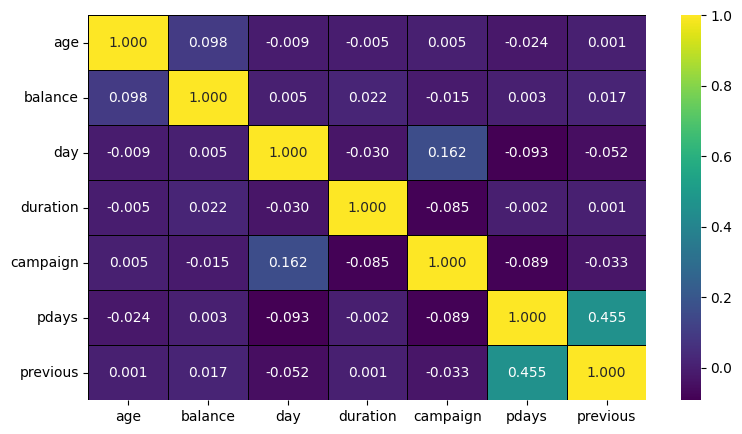

In [30]:
#heatmap for only numeric feature
plt.figure(figsize=(9,5))
sns.heatmap(bank_df_num.corr(),annot=True,cmap='viridis',fmt='.3f',linewidth=0.5,linecolor='black')

<Axes: >

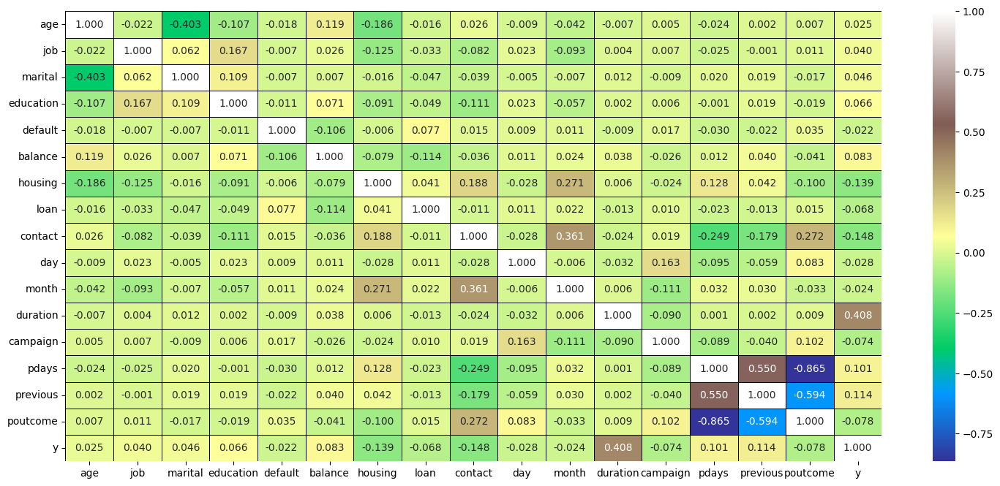

In [31]:
#heatmap for all features
plt.figure(figsize=(18,8))
sns.heatmap(bank_df1.corr(),annot=True,cmap='terrain',fmt='.3f',linewidth=0.5,linecolor='black')

# **Pairplot**

<Figure size 1000x800 with 0 Axes>

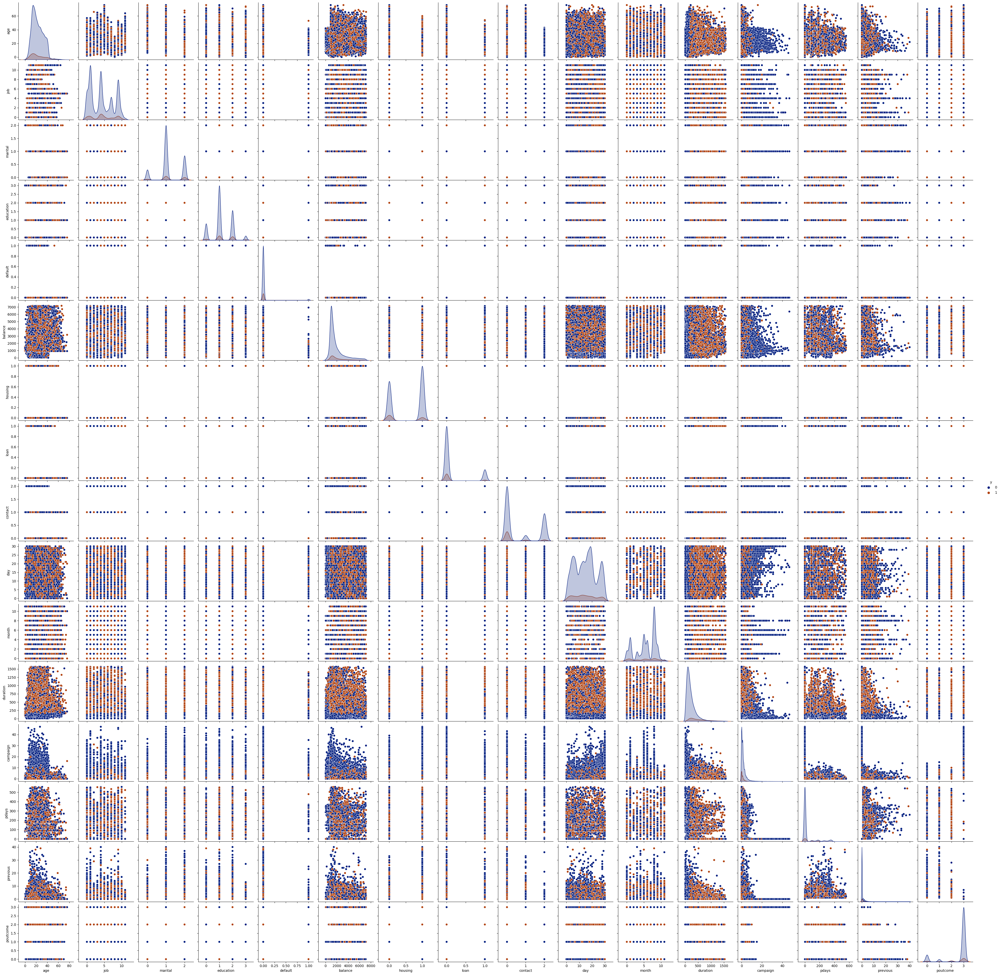

In [32]:
#pairplot
plt.figure(figsize=(10,8))
sns.pairplot(bank_df1,hue='y',palette='dark')
plt.show()

# **Histogram**

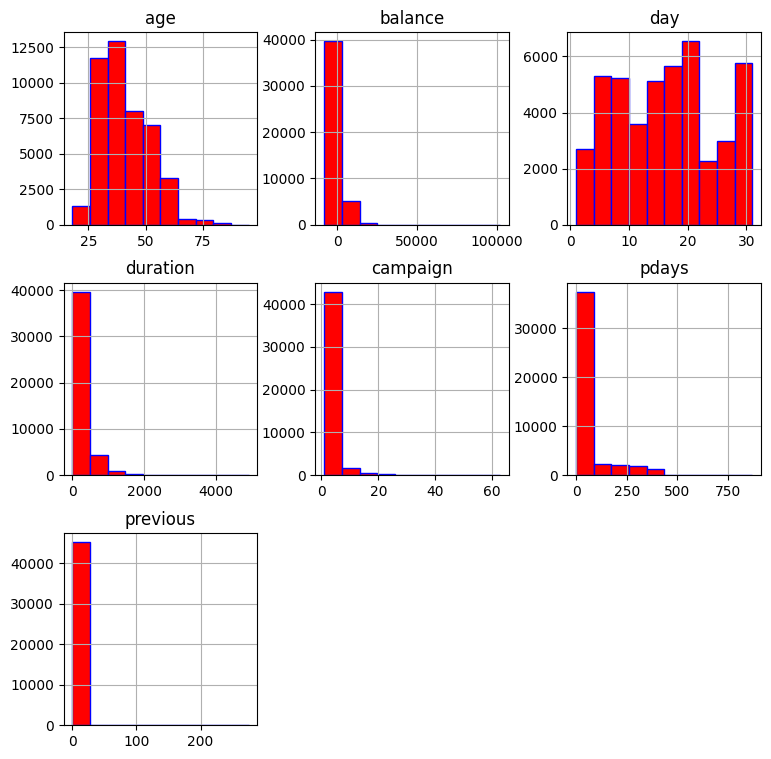

In [33]:
#histogram
bank_df_num.hist(figsize=(9,9),color='red',rwidth=1,edgecolor='blue')
plt.show()

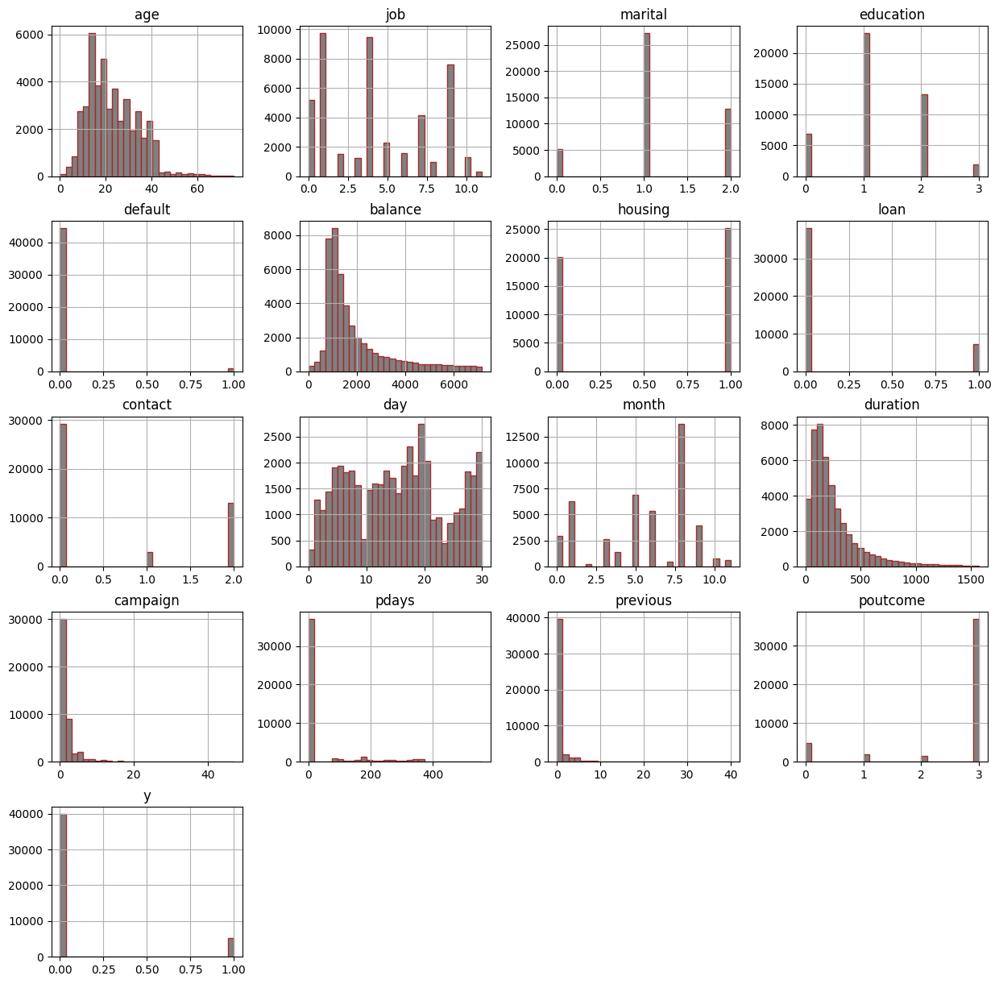

In [34]:
bank_df1.hist(bins=30,figsize=(15,15),color='gray',rwidth=1,edgecolor='brown')
plt.show()

# **Barplot**

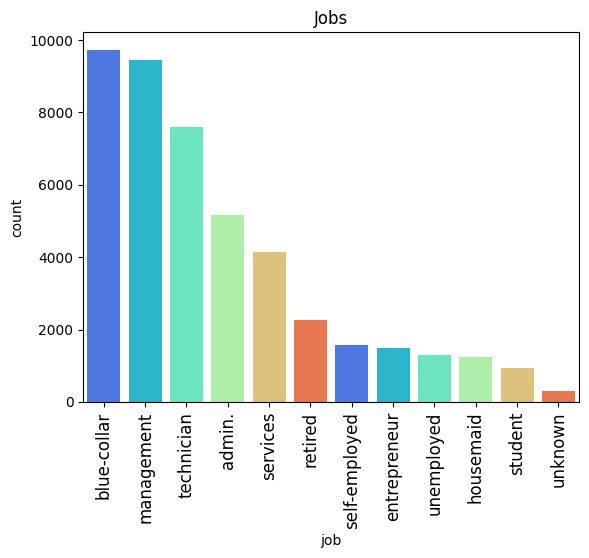

In [35]:
#barplot for job feature
color = sns.color_palette('rainbow')
sns.countplot(x='job', data=bank_df, palette = color,
              order=bank_df['job'].value_counts().index)
plt.xticks(rotation = 90,fontsize = 12)
plt.title('Jobs')
plt.show()

Text(0.5, 1.0, 'Marital Status')

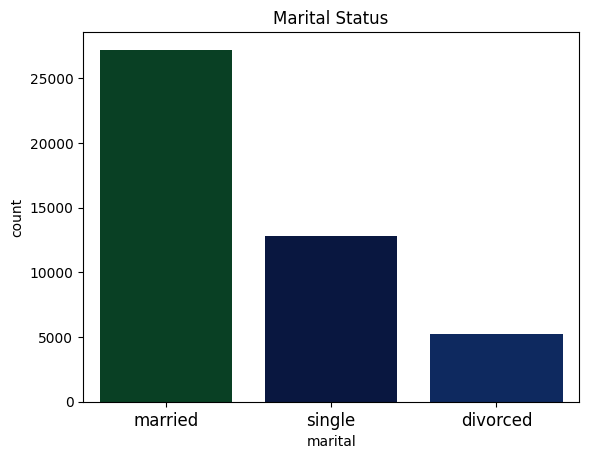

In [36]:
#barplot for martial status
color = sns.color_palette('ocean')
sns.countplot(x='marital', data=bank_df, palette = color,
              order=bank_df['marital'].value_counts().index)
plt.xticks(fontsize = 12)
plt.title('Marital Status')

Text(0.5, 1.0, 'Education')

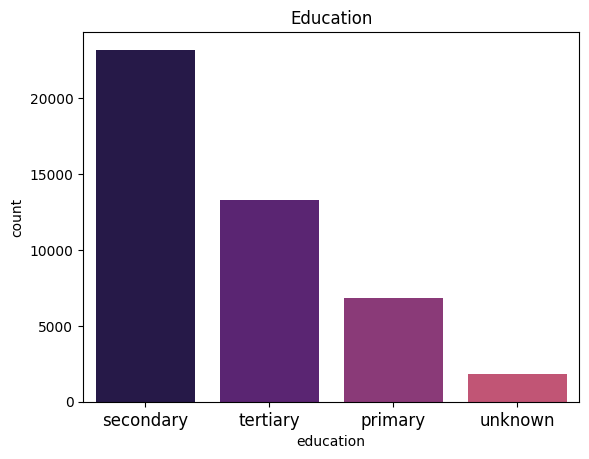

In [37]:
#barplot for education
color = sns.color_palette('magma')
sns.countplot(x='education', data=bank_df, palette = color,
              order=bank_df['education'].value_counts().index)
plt.xticks(fontsize = 12)
plt.title('Education')

# **Model Building**

In [38]:
#y is the dependent variable
#dividing in input and output variable
#X independent feature
#Y dependent feature

In [39]:
bank_df1.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,40,4,1,2,0,3036,1,0,2,4,8,261,0,0,0,3,0
1,26,9,2,1,0,945,1,0,2,4,8,151,0,0,0,3,0
2,15,2,1,1,0,918,1,1,2,4,8,76,0,0,0,3,0
3,29,1,1,3,0,2420,1,0,2,4,8,92,0,0,0,3,0
4,15,11,2,3,0,917,0,0,2,4,8,198,0,0,0,3,0


In [40]:
X=bank_df1.iloc[:,0:16]
Y=bank_df1.iloc[:,-1]

In [41]:
X

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,40,4,1,2,0,3036,1,0,2,4,8,261,0,0,0,3
1,26,9,2,1,0,945,1,0,2,4,8,151,0,0,0,3
2,15,2,1,1,0,918,1,1,2,4,8,76,0,0,0,3
3,29,1,1,3,0,2420,1,0,2,4,8,92,0,0,0,3
4,15,11,2,3,0,917,0,0,2,4,8,198,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,33,9,1,2,0,1741,0,0,0,16,9,975,2,0,0,3
45207,53,5,0,0,0,2639,0,0,0,16,9,456,1,0,0,3
45208,54,5,1,1,0,5455,0,0,0,16,9,1116,4,181,3,2
45209,39,1,1,1,0,1584,0,0,1,16,9,508,3,0,0,3


In [42]:
Y

0        0
1        0
2        0
3        0
4        0
        ..
45206    1
45207    1
45208    1
45209    0
45210    0
Name: y, Length: 45211, dtype: int64

In [43]:
#logistic regression
classifier=LogisticRegression()       #initialization data

In [44]:
classifier.fit(X,Y)             #fitting the model

LogisticRegression()

In [45]:
y_pred=classifier.predict(X)       #prediction

In [46]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [47]:
#dataframe for actual and predicted value
y_pdf=pd.DataFrame({'actual value':Y,
                    'predicted value':y_pred})

In [48]:
y_pdf

,actual value,predicted value
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
45206,1,0
45207,1,0
45208,1,0
45209,0,0


In [49]:
print(y_pdf.to_string())

       actual value  predicted value
0                 0                0
1                 0                0
2                 0                0
3                 0                0
4                 0                0
5                 0                0
6                 0                0
7                 0                0
8                 0                0
9                 0                0
10                0                0
11                0                0
12                0                0
13                0                0
14                0                0
15                0                0
16                0                0
17                0                0
18                0                0
19                0                0
20                0                0
21                0                0
22                0                0
23                0                0
24                0                0
25                0                0
2

In [50]:
#confusion matrix for the model accuracy

In [51]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import r2_score

In [52]:
#confusion matrix
confusion_matrix=confusion_matrix(Y,y_pred)
confusion_matrix

array([[38988,   934],
       [ 4251,  1038]])

In [53]:
#classification report
classification=classification_report(Y,y_pred)
print(classification)

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     39922
           1       0.53      0.20      0.29      5289

    accuracy                           0.89     45211
   macro avg       0.71      0.59      0.61     45211
weighted avg       0.86      0.89      0.86     45211



In [54]:
classifier.predict_proba(X)

array([[0.93988143, 0.06011857],
       [0.95048619, 0.04951381],
       [0.95618816, 0.04381184],
       ...,
       [0.57869763, 0.42130237],
       [0.93778246, 0.06221754],
       [0.52560544, 0.47439456]])

In [55]:
classifier.predict_proba(X)

array([[0.93988143, 0.06011857],
       [0.95048619, 0.04951381],
       [0.95618816, 0.04381184],
       ...,
       [0.57869763, 0.42130237],
       [0.93778246, 0.06221754],
       [0.52560544, 0.47439456]])

# **ROC Curve**

In [56]:
#roc

In [57]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [58]:
fpr,tpr,thresholds=roc_curve(Y,classifier.predict_proba(X)[:,1])

In [59]:
auc=roc_auc_score(Y,y_pred)

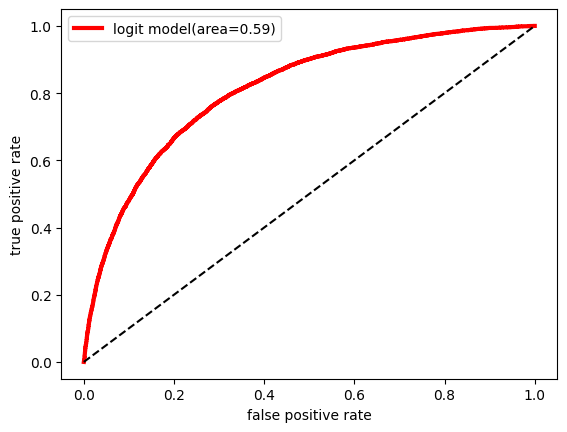

In [60]:
plt.plot(fpr,tpr,color='red',label='logit model(area=%0.2f)'%auc,linewidth=3)
plt.plot([0,1],[0,1],'k--')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend()
plt.show()

In [61]:
print(thresholds.mean())

0.24498376137082076


In [62]:
print(auc)

0.5864303798533061


In [63]:
sm.Logit(Y,X).fit().summary()

Optimization terminated successfully.
         Current function value: 0.275393
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                45211
Model:                          Logit   Df Residuals:                    45195
Method:                           MLE   Df Model:                           15
Date:                Mon, 15 Jan 2024   Pseudo R-squ.:                  0.2369
Time:                        05:36:44   Log-Likelihood:                -12451.
converged:                       True   LL-Null:                       -16315.
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
age           -0.0215      0.001    -14.504      0.000      -0.024      -0.019
job           -0.0246      0.005     -4.771      0.000      -0.035      -0.014
marital       -0.2289      0.027     -8.502      0.000      -0.282      -0.176
education     -0.0131      0.022     -0.593      0.553      -0.057       0.030
default       -0.4029      0.160     -2.518      0.012      -0.716      -0.089
balance     3.482e-05   1.09e-05      3.197      0.001    1.35e-05    5.62e-05
housing       -1.3065      0.037    -35.423      0.000      -1.379      -1.234
loan          -0.8666      0.057    -15.325      0.000      -0.977      -0.756
contact       -0.5970      0.027    -22.435      0.000      -0.649      -0.545
day           -0.0210      0.002    -10.613      0.000      -0.025      -0.017
month         -0.0056      0.005     -1.054      0.292      -0.016       0.005
duration       0.0040   6.09e-05     65.981      0.000       0.004       0.004
campaign      -0.1541      0.010    -14.866      0.000      -0.174      -0.134
pdays         -0.0015      0.000     -6.264      0.000      -0.002      -0.001
previous       0.0592      0.008      7.323      0.000       0.043       0.075
poutcome      -0.3963      0.020    -19.661      0.000      -0.436      -0.357
==============================================================================
"""

In [64]:
accuracy_score(Y,y_pred)

0.885315520559156

In [65]:
#Accuracy is 88%

**Accuracy score is 0.885315520559156 i.e 88%**

In [66]:
#completed//////

# **Completed**